This notebook aims to animate the body two problem

Programmed by Zhiyuan Guo

Last update data: 4/26/2019

The Lagrangian the two body problem is given by

$\begin{equation}
    \mathcal{L} = \frac{1}{2}m_1(\dot x_1^2 + \dot y_1^2) + \frac{1}{2}m_2(\dot x_2^2 + \dot y_2^2) + \frac{Gm_1m_2}{r_{12}}
\end{equation}$

with $r_{12} = \sqrt{(x_1-x_2)^2+(y_1-y_2)^2}$

After applying Euler-Lagrangian equation, we get

$\begin{align}
   \ddot x_1 &= -\frac{Gm_2(x_1-x_2)}{r^3} \\
   \ddot y_1 &= -\frac{Gm_2(y_1-y_2)}{r^3} \\
   \ddot x_2 &= \frac{Gm_1(x_1-x_2)}{r^3} \\
   \ddot y_2 &= \frac{Gm_1(y_1-y_2)}{r^3} \\
   &With\ r = \sqrt{(x_1-x_2)^2+(y_1-y_2)^2}
\end{align}$

In [1]:
# Import libaray needed
from matplotlib import animation, rc
from IPython.display import HTML
import sys
import numpy as np
from scipy.integrate import odeint
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from scipy.integrate import odeint, solve_ivp

In [2]:
 class Lagrangian2body():
    """
    Lagrangian2body class implements the parameters and Lagrange's equations for 
     two body problem.
     
    Parameters
    ----------
    m1 : float
        mass for the first object
    m2 : float
        mass for the second object
    G : float
         gravitational constant


    Methods
    -------
    dy_dt(t, y)
        Returns the right side of the differential equation in vector y, 
        given time t and the corresponding value of y.
        Implement the equation derived above the markdowns
    """
    def __init__(self,m1 = 1.,m2 = 1., G =1.):
        self.m1 = m1
        self.m2 = m2
        self.G = G

    
    def dy_dt(self, t_pts, y):
        """Return the first derivatives of y = theta1, z1, theta2, z2."""
        
        x1, x1p,y1,y1p, x2 ,x2p,y2,y2p = y
        
        #r12
        r = ((x1-x2)**2.+(y1-y2)**2.)**(0.5)
        
        #x1 double dot
        x1pp = -(x1-x2)*self.m2*self.G / r**3.
        
        #y1 double dot
        y1pp = -(y1-y2)*self.m2*self.G / r**3.
        
        #x2 double dot
        x2pp = (x1-x2)*self.m1*self.G / r**3.
        
        #y2 double dot
        y2pp = (y1-y2)*self.m1*self.G / r**3.
        
        
        return[x1p,x1pp,y1p,y1pp,x2p,x2pp,y2p,y2pp]

    
    def solve_ode(self, t_pts,x1_0,x1_dot_0,y1_0,y1_dot_0,x2_0,x2_dot_0,y2_0,y2_dot_0,
                  abserr=1.0e-12, relerr=1.0e-12):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr to get more precision.
        """
        y0 = [x1_0,x1_dot_0,y1_0,y1_dot_0,x2_0,x2_dot_0,y2_0,y2_dot_0]

        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]),
                             y0,method = 'RK45',t_eval=t_pts, atol=abserr, rtol=relerr)

        return solution.y

    def solve_ode_Leapfrog(self, t_pts,x1_0,x1_dot_0,y1_0,y1_dot_0,x2_0,x2_dot_0,y2_0,y2_dot_0):
        '''
        Solve the ODE with leapfrog method given initial conditions
        '''
        delta_t = t_pts[1] - t_pts[0]
        
        # initialize the arrays for x1_0,x1_dot_0,y1_0,y1_dot_0,x2_0,x2_dot_0,y2_0,y2_dot_0 with zeros
        num_t_pts = len(t_pts)
        x1 = np.zeros(num_t_pts)
        x1_dot = np.zeros(num_t_pts)
        x1_dot_half = np.zeros(num_t_pts)
        
        y1 = np.zeros(num_t_pts)
        y1_dot = np.zeros(num_t_pts)
        y1_dot_half = np.zeros(num_t_pts)
        
        x2 = np.zeros(num_t_pts)
        x2_dot = np.zeros(num_t_pts)
        x2_dot_half = np.zeros(num_t_pts)
        
        y2 = np.zeros(num_t_pts)
        y2_dot = np.zeros(num_t_pts)
        y2_dot_half = np.zeros(num_t_pts)
        
        # initial conditions
        x1[0] = x1_0
        x1_dot[0] = x1_dot_0
        y1[0] = y1_0
        y1_dot[0] = y1_dot_0
        x2[0] = x2_0
        x2_dot[0] = x2_dot_0
        y2[0] = y2_0
        y2_dot[0] = y2_dot_0   

        for i in np.arange(num_t_pts - 1):
            t = t_pts[i]
            y = [x1[i],x1_dot[i],y1[i],y1_dot[i],x2[i],x2_dot[i],y2[i],y2_dot[i]]
            
            x1_dot_half[i] = x1_dot[i] + self.dy_dt(t,y)[1]*delta_t/2
            y1_dot_half[i] = y1_dot[i] + self.dy_dt(t,y)[3]*delta_t/2
            x2_dot_half[i] = x2_dot[i] + self.dy_dt(t,y)[5]*delta_t/2
            y2_dot_half[i] = y2_dot[i] + self.dy_dt(t,y)[7]*delta_t/2
            
            x1[i+1] = x1[i] + x1_dot_half[i]*delta_t
            y1[i+1] = y1[i] + y1_dot_half[i]*delta_t
            x2[i+1] = x2[i] + x2_dot_half[i]*delta_t
            y2[i+1] = y2[i] + y2_dot_half[i]*delta_t  
            
            y = [x1[i+1],x1_dot[i],y1[i+1],y1_dot[i],x2[i+1],x2_dot[i],y2[i+1],y2_dot[i]]
            
            x1_dot[i+1] = x1_dot_half[i] + self.dy_dt(t,y)[1] * delta_t/2
            y1_dot[i+1] = y1_dot_half[i] + self.dy_dt(t,y)[3] * delta_t/2
            x2_dot[i+1] = x2_dot_half[i] + self.dy_dt(t,y)[5] * delta_t/2
            y2_dot[i+1] = y2_dot_half[i] + self.dy_dt(t,y)[7] * delta_t/2
            
        return x1,x1_dot,y1,y1_dot,x2,x2_dot,y2,y2_dot
    
    def energy(self, x1, x1_dot,y1,y1_dot,x2, x2_dot,y2,y2_dot):
        """Evaluate the energy as a function of time"""
        
        r = ((x1-x2)**2.+(y1-y2)**2.)**(0.5)
        Energy = 0.5*self.m1*(x1_dot**2 + y1_dot**2) + 0.5*self.m2*(x2_dot**2 + y2_dot**2) - G*self.m1*self.m2/r
        return (Energy)

In [3]:
# m1: mass of 1st object
m1 = 1
# m2:mass of 2nd object
m2 = 2.
# The gravitational constant
G = 1.

p1 = Lagrangian2body(m1 = m1,m2 = m2 , G = G)

# Maximum time, time point spacings and the time grid (all in s).
tmax, dt = 100, 0.01
t_pts = np.arange(0, tmax, dt)

# Initial conditions: x1_0,x1_dot_0,y1_0,y1_dot_0,x2_0,x2_dot_0,y2_0,y2_dot_0
# the position for mass 2 is calculated to ensure CM is stationary
x1_0,x1_dot_0 = -0.9,0
y1_0,y1_dot_0 = 0,0.3
x2_0,x2_dot_0 = -m1/ m2 * x1_0 , -m1 / m2 * x1_dot_0
y2_0,y2_dot_0 = -m1/ m2 * y1_0 , -m1 / m2 * y1_dot_0


# Do the numerical integration of the equations of motion

#solution from solve_ivp
y = p1.solve_ode(t_pts,x1_0,x1_dot_0,y1_0,y1_dot_0,x2_0,x2_dot_0,y2_0,y2_dot_0 )

x1_pts, y1_pts,x2_pts, y2_pts = y[0], y[2],y[4], y[6]


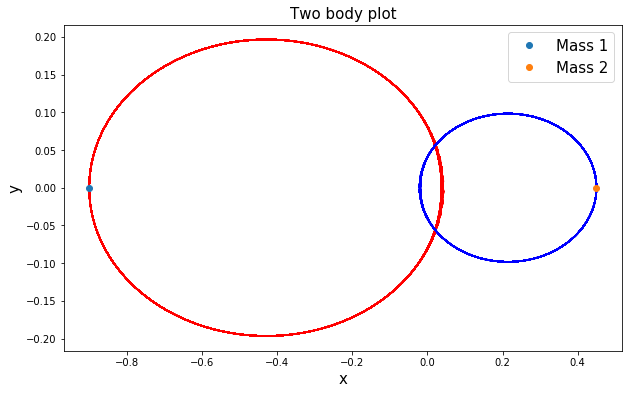

In [4]:
plt.figure(figsize = (10,6))
plt.title('Two body plot',fontsize = 15)
plt.plot(x1_pts,y1_pts,'r-')
plt.plot(x2_pts,y2_pts,'b-')
plt.plot(x1_pts[0],y1_pts[0],'o',label = 'Mass 1')
plt.plot(x2_pts[0],y2_pts[0],'o',label = 'Mass 2')
plt.xlabel ('x',fontsize = 15)
plt.ylabel ('y',fontsize = 15)
plt.legend(loc = 'best',fontsize = 15)

## Two body Animation

In [5]:
%%capture
fig_anim = plt.figure(figsize=(10,6))
ax_anim = fig_anim.add_subplot(1,1,1)

ln1_anim, = ax_anim.plot(x1_pts,y1_pts,lw = 1)
ln2_anim, = ax_anim.plot(x2_pts,y2_pts,lw = 1)
pt1_anim, = ax_anim.plot(x1_pts[0],y1_pts[0],'o',label = 'm1')
pt2_anim, = ax_anim.plot(x2_pts[0],y2_pts[0],'o',label = 'm2')
plt.legend(loc = 'best',fontsize = 15)
plt.xlabel('$x$',fontsize = 15)
plt.ylabel('$y$', fontsize = 15)


In [6]:
def animate_wave(i):
    """This is the function called by FuncAnimation to create each frame,
        numbered by i.  So each i corresponds to a point in the t_pts
        array, with index i.
    """

    pt1_anim.set_data(x1_pts[i], y1_pts[i])  # overwrite line_anim with new points
    pt2_anim.set_data(x2_pts[i], y2_pts[i])
    return (pt1_anim,pt2_anim)   # this is needed for blit=True to work


In [7]:
frame_interval = 40.  # time between frames
frame_number = 400    # number of frames to include (index of t_pts)
anim = animation.FuncAnimation(fig_anim, 
                               animate_wave, 
                               init_func=None,
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True,
                               repeat=False)

#fig.show()

In [8]:
HTML(anim.to_jshtml())

## For case in which  one object's mass is much larger than the other one

In [9]:
# m1: mass of 1st object
m1 = 0.01
# m2:mass of 2nd object
m2 = 2.
# The gravitational constant
G = 1.

p1 = Lagrangian2body(m1 = m1,m2 = m2 , G = G)

# Maximum time, time point spacings and the time grid (all in s).
tmax, dt = 100, 0.001
t_pts = np.arange(0, tmax, dt)

# Initial conditions: x1_0,x1_dot_0,y1_0,y1_dot_0,x2_0,x2_dot_0,y2_0,y2_dot_0
# the position for mass 2 is calculated to ensure CM is stationary
x1_0,x1_dot_0 = -0.9,0
y1_0,y1_dot_0 = 0,0.3
x2_0,x2_dot_0 = -m1/ m2 * x1_0 , -m1 / m2 * x1_dot_0
y2_0,y2_dot_0 = -m1/ m2 * y1_0 , -m1 / m2 * y1_dot_0


# Do the numerical integration of the equations of motion

#solution from solve_ivp
y = p1.solve_ode(t_pts,x1_0,x1_dot_0,y1_0,y1_dot_0,x2_0,x2_dot_0,y2_0,y2_dot_0 )
x1_pts, y1_pts,x2_pts, y2_pts = y[0], y[2],y[4], y[6]


### As one body become much larger than the other one, the larger mass is nearly stationary with the other rotating around it

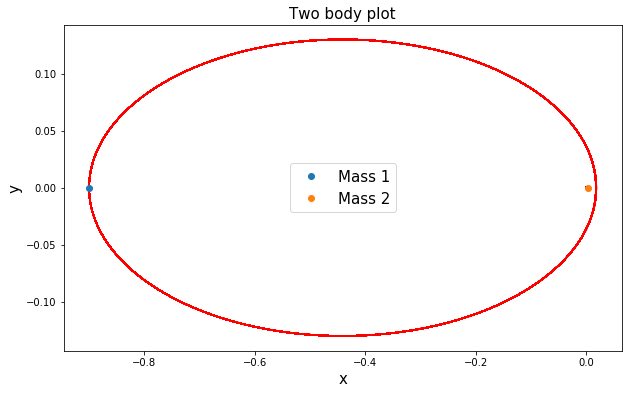

In [10]:
plt.figure(figsize = (10,6))
plt.title('Two body plot',fontsize = 15)
plt.plot(x1_pts,y1_pts,'r-')
plt.plot(x2_pts,y2_pts,'b-')
plt.plot(x1_pts[0],y1_pts[0],'o',label = 'Mass 1')
plt.plot(x2_pts[0],y2_pts[0],'o',label = 'Mass 2')
plt.xlabel ('x',fontsize = 15)
plt.ylabel ('y',fontsize = 15)
plt.legend(loc = 'best',fontsize = 15)

## Comparing Scipy ODE with Leapfrop method

In [11]:
# m1: mass of 1st object
m1 = 1
# m2:mass of 2nd object
m2 = 2.
# The gravitational constant
G = 1.

p1 = Lagrangian2body(m1 = m1,m2 = m2 , G = G)

# Maximum time, time point spacings and the time grid (all in s).
tmax, dt = 50, 0.0001
t_pts = np.arange(0, tmax, dt)

# Initial conditions: x1_0,x1_dot_0,y1_0,y1_dot_0,x2_0,x2_dot_0,y2_0,y2_dot_0
# the position for mass 2 is calculated to ensure CM is stationary
x1_0,x1_dot_0 = -0.9,0
y1_0,y1_dot_0 = 0,0.3
x2_0,x2_dot_0 = -m1/ m2 * x1_0 , -m1 / m2 * x1_dot_0
y2_0,y2_dot_0 = -m1/ m2 * y1_0 , -m1 / m2 * y1_dot_0


# Do the numerical integration of the equations of motion

#solution from solve_ivp
y = p1.solve_ode(t_pts,x1_0,x1_dot_0,y1_0,y1_dot_0,x2_0,x2_dot_0,y2_0,y2_dot_0 )
x1_pts, y1_pts,x2_pts, y2_pts = y[0], y[2],y[4], y[6]

#solution from leapfrog
y_leap = p1.solve_ode_Leapfrog (t_pts,x1_0,x1_dot_0,y1_0,y1_dot_0,x2_0,x2_dot_0,y2_0,y2_dot_0)
x1_pts_leap, y1_pts_leap,x2_pts_leap, y2_pts_leap = y_leap[0], y_leap[2],y_leap[4], y_leap[6]




In [12]:
#Calculate the relative energy for solutions from each of these two methods

# Scipy ODE
E_tot_pts = p1.energy(y[0],y[1],y[2],y[3],y[4],y[5],y[6],y[7])
E_tot_0 = E_tot_pts[0]
E_tot_rel_pts = np.abs((E_tot_pts - E_tot_0)/E_tot_0)


# Leapfrog
E_tot_pts_LF = p1.energy(y_leap[0],y_leap[1],y_leap[2],y_leap[3],y_leap[4],y_leap[5],y_leap[6],y_leap[7])
E_tot_0_LF = E_tot_pts_LF[0]
E_tot_rel_pts_LF = np.abs((E_tot_pts_LF - E_tot_0_LF)/E_tot_0_LF)

### From the energy plot below, it is clear that the solution from Scipy ODE solver does not conserve energy, while Leapfrog gives us the solution with conserved energy

Text(0.5,0,'t')

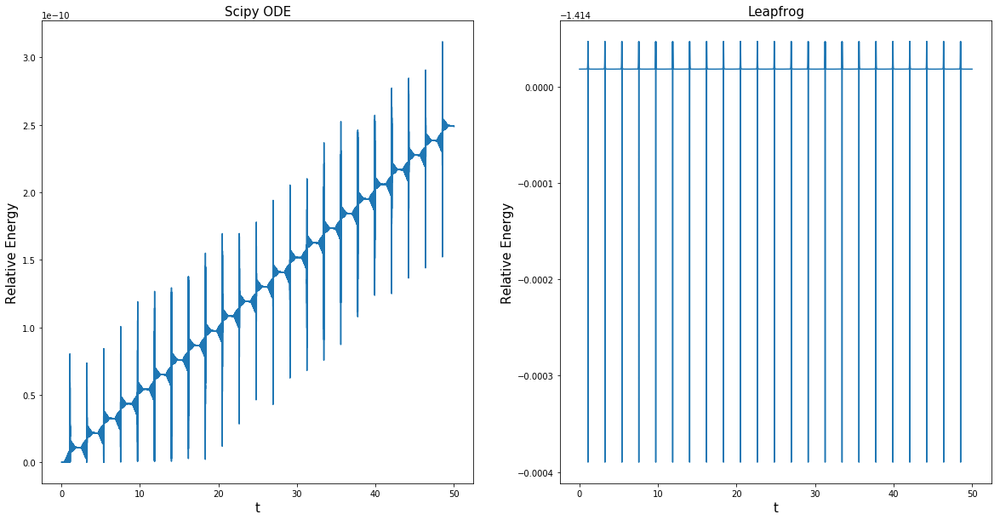

In [13]:
plt.figure(figsize = (20,10))
plt.subplot(121)
plt.plot(t_pts,E_tot_rel_pts)
plt.title('Scipy ODE',fontsize = 15)
plt.ylabel('Relative Energy',fontsize = 15)
plt.xlabel ('t',fontsize = 15)
plt.subplot(122)
plt.title('Leapfrog',fontsize = 15)
plt.plot(t_pts,E_tot_pts_LF)
plt.ylabel('Relative Energy',fontsize = 15)
plt.xlabel ('t',fontsize = 15)